In [ ]:
# Conexión con Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import math
import missingno
import numpy as np

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/TFM/data/data.csv', sep=';')
data.rename(columns={'FORCE_2020_LITHOFACIES_LITHOLOGY':'LITHOLOGY', 'FORCE_2020_LITHOFACIES_CONFIDENCE':'CONFIDENCE'},inplace=True)
data.head()

,WELL,DEPTH_MD,X_LOC,Y_LOC,Z_LOC,GROUP,FORMATION,CALI,RSHA,RMED,RDEP,RHOB,GR,SGR,NPHI,PEF,DTC,SP,BS,ROP,DTS,DCAL,DRHO,MUDWEIGHT,RMIC,ROPA,RXO,LITHOLOGY,CONFIDENCE
0,15/9-13,494.528,437641.96875,6470972.5,-469.501831,NORDLAND GP.,NaN,19.480835,NaN,1.611410,1.798681,1.884186,80.200851,NaN,NaN,20.915468,161.131180,24.612379,NaN,34.636410,NaN,NaN,-0.574928,NaN,NaN,NaN,NaN,65000,1.0
1,15/9-13,494.680,437641.96875,6470972.5,-469.653809,NORDLAND GP.,NaN,19.468800,NaN,1.618070,1.795641,1.889794,79.262886,NaN,NaN,19.383013,160.603470,23.895531,NaN,34.636410,NaN,NaN,-0.570188,NaN,NaN,NaN,NaN,65000,1.0
2,15/9-13,494.832,437641.96875,6470972.5,-469.805786,NORDLAND GP.,NaN,19.468800,NaN,1.626459,1.800733,1.896523,74.821999,NaN,NaN,22.591518,160.173615,23.916357,NaN,34.779556,NaN,NaN,-0.574245,NaN,NaN,NaN,NaN,65000,1.0
3,15/9-13,494.984,437641.96875,6470972.5,-469.957794,NORDLAND GP.,NaN,19.459282,NaN,1.621594,1.801517,1.891913,72.878922,NaN,NaN,32.191910,160.149429,23.793688,NaN,39.965164,NaN,NaN,-0.586315,NaN,NaN,NaN,NaN,65000,1.0
4,15/9-13,495.136,437641.96875,6470972.5,-470.109772,NORDLAND GP.,NaN,19.453100,NaN,1.602679,1.795299,1.880034,71.729141,NaN,NaN,38.495632,160.128342,24.104078,NaN,57.483765,NaN,NaN,-0.597914,NaN,NaN,NaN,NaN,65000,1.0


In [ ]:
data['WELL'].nunique()

98

In [ ]:
data['LITHOLOGY'].value_counts()

65000    720803
30000    168937
65030    150455
70000     56320
80000     33329
99000     15245
70032     10513
88000      8213
90000      3820
74000      1688
86000      1085
93000       103
Name: LITHOLOGY, dtype: int64

In [ ]:
data['CONFIDENCE'].value_counts()

1.0    1013705
2.0     121018
3.0      35609
Name: CONFIDENCE, dtype: int64

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1170511 entries, 0 to 1170510
Data columns (total 29 columns):
 #   Column      Non-Null Count    Dtype  
---  ------      --------------    -----  
 0   WELL        1170511 non-null  object 
 1   DEPTH_MD    1170511 non-null  float64
 2   X_LOC       1159736 non-null  float64
 3   Y_LOC       1159736 non-null  float64
 4   Z_LOC       1159736 non-null  float64
 5   GROUP       1169233 non-null  object 
 6   FORMATION   1033517 non-null  object 
 7   CALI        1082634 non-null  float64
 8   RSHA        630650 non-null   float64
 9   RMED        1131518 non-null  float64
 10  RDEP        1159496 non-null  float64
 11  RHOB        1009242 non-null  float64
 12  GR          1170511 non-null  float64
 13  SGR         69353 non-null    float64
 14  NPHI        765409 non-null   float64
 15  PEF         671692 non-null   float64
 16  DTC         1089648 non-null  float64
 17  SP          864247 non-null   float64
 18  BS          682657 non

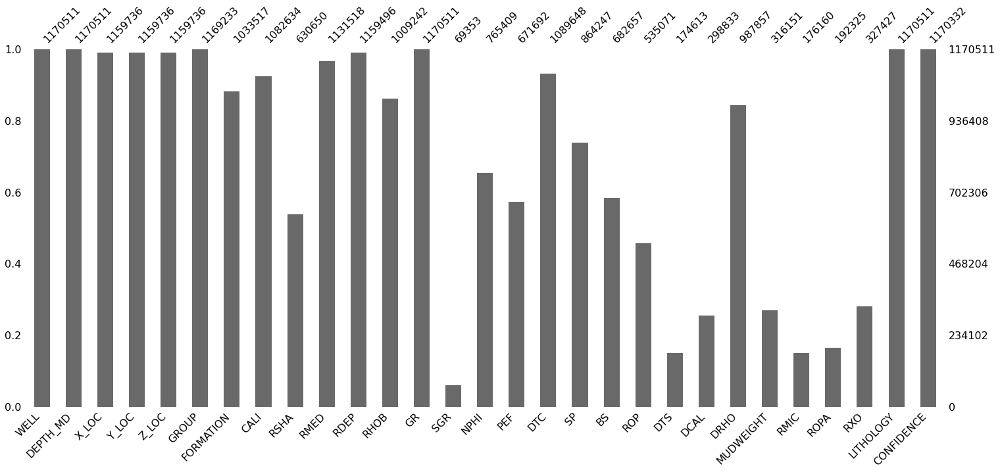

In [ ]:
missingno.bar(data)

In [ ]:
for i in data.columns:
    pct_missing = np.mean(data[i].isnull())
    print('{} - {}%'.format(i, round(pct_missing*100)))

WELL - 0%
DEPTH_MD - 0%
X_LOC - 1%
Y_LOC - 1%
Z_LOC - 1%
GROUP - 0%
FORMATION - 12%
CALI - 8%
RSHA - 46%
RMED - 3%
RDEP - 1%
RHOB - 14%
GR - 0%
SGR - 94%
NPHI - 35%
PEF - 43%
DTC - 7%
SP - 26%
BS - 42%
ROP - 54%
DTS - 85%
DCAL - 74%
DRHO - 16%
MUDWEIGHT - 73%
RMIC - 85%
ROPA - 84%
RXO - 72%
LITHOLOGY - 0%
CONFIDENCE - 0%


In [ ]:
#data1 = data[["DEPTH_MD","CALI","RSHA","RMED","RDEP","RHOB","GR","SGR","NPHI","DTC","SP","BS","RMIC","ROPA","RXO","LITHOLOGY","CONFIDENCE"]]
data1 = data[["DEPTH_MD","RSHA","RMED","RDEP","RHOB","GR","NPHI","LITHOLOGY","CONFIDENCE"]]

In [ ]:
for i in data1.columns:
    pct_missing = np.mean(data1[i].isnull())
    print('{} - {}%'.format(i, round(pct_missing*100)))

DEPTH_MD - 0%
RSHA - 46%
RMED - 3%
RDEP - 1%
RHOB - 14%
GR - 0%
NPHI - 35%
LITHOLOGY - 0%
CONFIDENCE - 0%


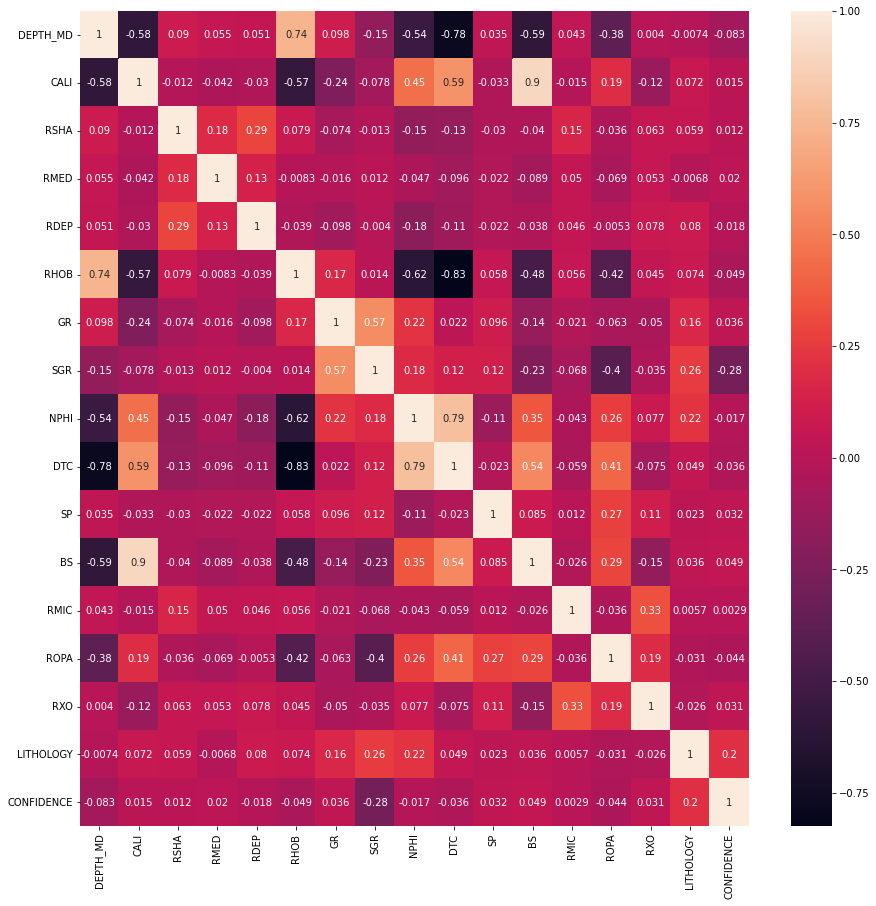

In [ ]:
plt.figure(figsize=(15,15))
sns.heatmap(data1.corr(),annot=True)

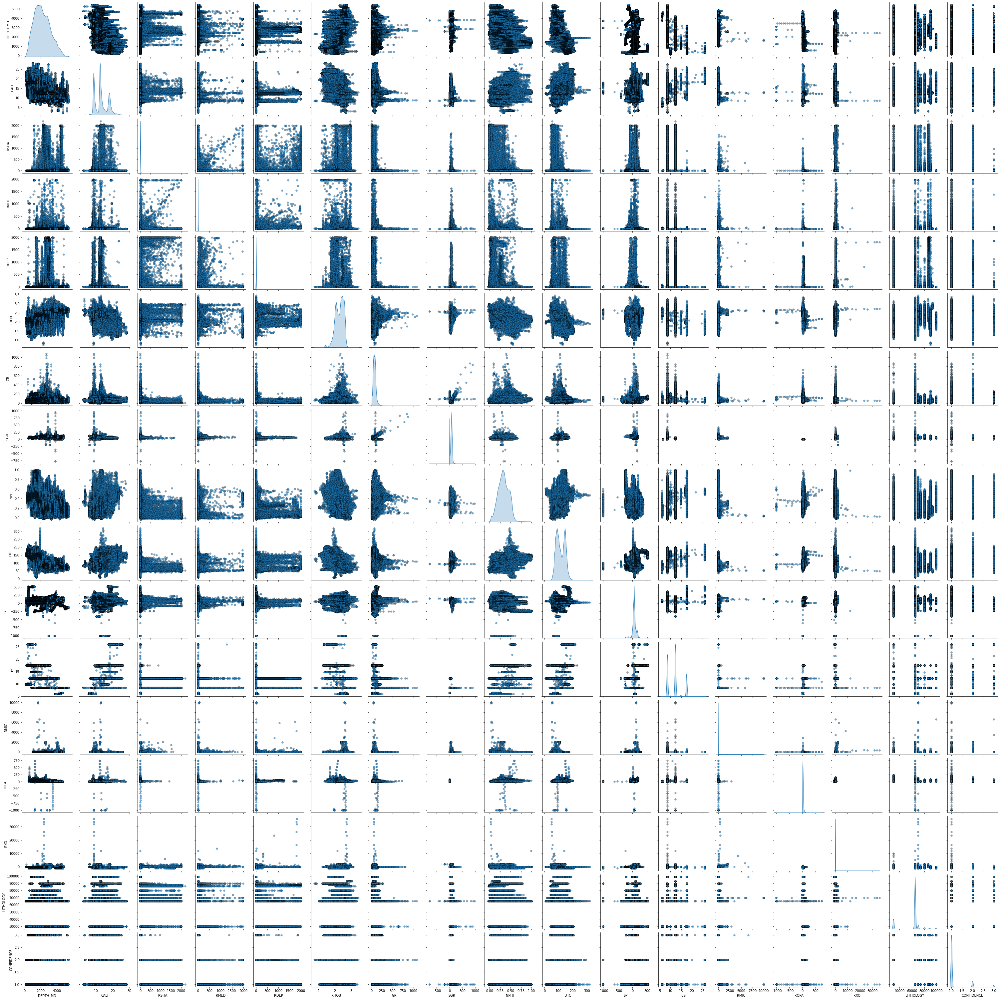

In [ ]:
train_features = ["DEPTH_MD","CALI","RSHA","RMED","RDEP","RHOB","GR","SGR","NPHI","DTC","SP","BS","RMIC","ROPA","RXO","LITHOLOGY","CONFIDENCE"]

sns.pairplot(data1, vars=train_features, diag_kind='kde',
             plot_kws = {'alpha': 0.6, 's': 30, 'edgecolor': 'k'})

In [ ]:
data1['RSHA'] = np.log10(data1['RSHA'])
data1['RMED'] = np.log10(data1['RMED'])
data1['RDEP'] = np.log10(data1['RDEP'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/pandas/core/series.py:726: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWi

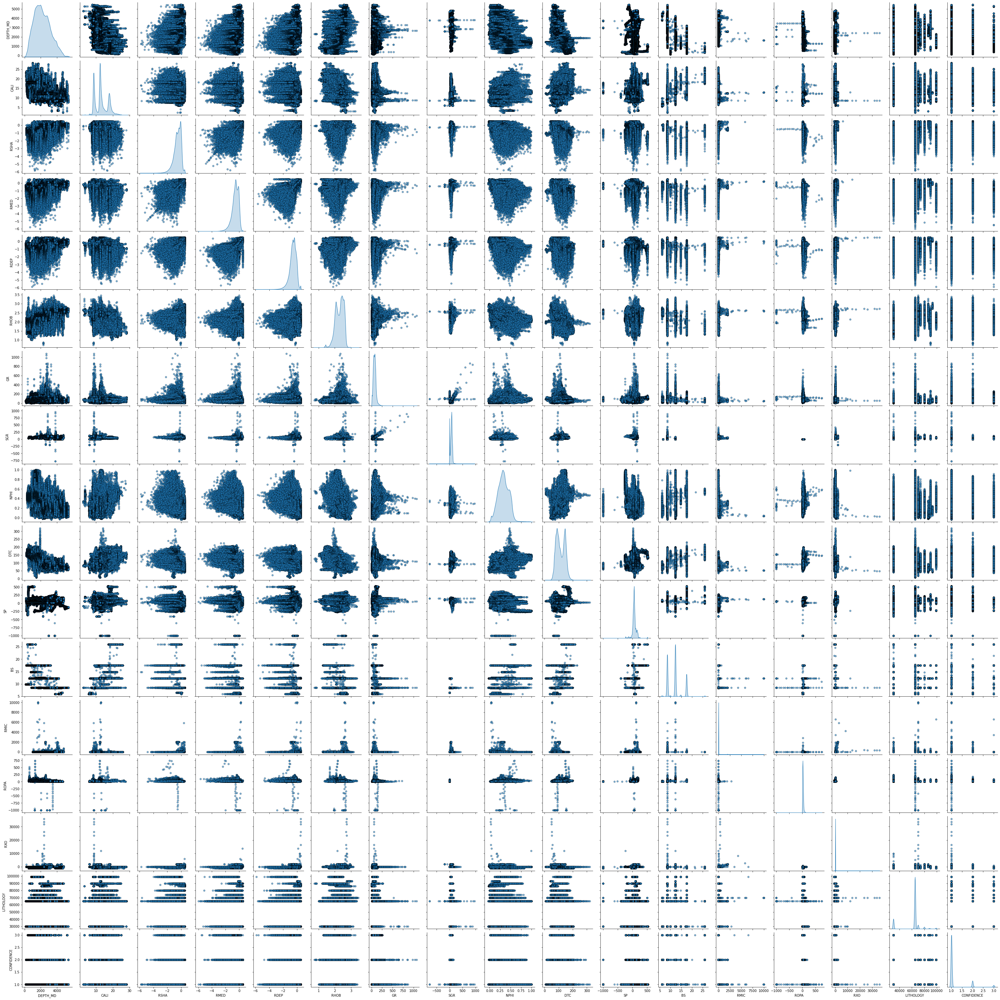

In [ ]:
train_features = ["DEPTH_MD","CALI","RSHA","RMED","RDEP","RHOB","GR","SGR","NPHI","DTC","SP","BS","RMIC","ROPA","RXO","LITHOLOGY","CONFIDENCE"]

sns.pairplot(data1, vars=train_features, diag_kind='kde',
             plot_kws = {'alpha': 0.6, 's': 30, 'edgecolor': 'k'})

OUTLIERS

In [ ]:
data1.dropna(inplace=True) #Remover NaN

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


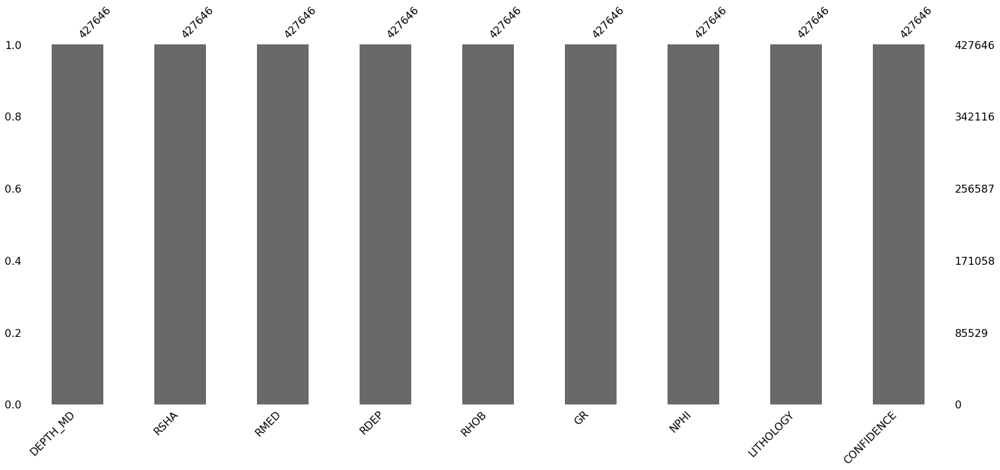

In [ ]:
missingno.bar(data1)

In [ ]:
data_drop = data1.drop(['DEPTH_MD',"LITHOLOGY","CONFIDENCE"], axis=1)

In [ ]:
for i in data1.columns:
    pct_missing = np.mean(data1[i].isnull())
    print('{} - {}%'.format(i, round(pct_missing*100)))

NameError: ignored

In [ ]:
#one class SVM
from sklearn.svm import OneClassSVM

svm = OneClassSVM(nu=0.1)
yhat = svm.fit_predict(data_drop)
mask = yhat != -1
data1_svm = well_train_norm[mask]